In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import rc_context

sc.settings.verbosity = 1


import os 
import sys
import gc
import importlib 

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['font.sans-serif'] = 'Arial'
sc.set_figure_params(dpi=50, dpi_save=300, vector_friendly=True)
sns.set_style('white', {'axes.grid' : False})


def vector(on=False):
    if on:
        sc.set_figure_params(dpi=50, dpi_save=300, vector_friendly=False)
    else:
        sc.set_figure_params(dpi=50, dpi_save=300, vector_friendly=True)
vector(False)

# QC and clustering 

In [2]:
def gem2adata(in_put, binsize, stereopy=False, in_type='file', sep='\t'):
    import scipy.sparse as sps
    if in_type == 'file':
        df = pd.read_csv(in_put, comment='#', sep=sep)
    if in_type == 'df':
        df = in_put.copy()
    if not stereopy:
        df['x'] = df['x'].apply(lambda x: int(x/binsize)*binsize)
        df['y'] = df['y'].apply(lambda x: int(x/binsize)*binsize)
    if stereopy:
        df = stereopy_merge(df, binsize=binsize)
        
    df['index'] = df['x'].apply(str) + '_' + df['y'].apply(str) + '@' + df['geneID']
    try:
        df = df[['index', 'MIDCounts']]
    except:
        df = df[['index', 'MIDCount']]
    
    df.columns = ['index', 'MIDCounts']

    df = df.groupby('index').sum()

    df[['index', 'geneID']] = [x.split('@') for x in df.index]
    index = df['index'].unique()
    idict = dict(zip(index, range(len(index))))
    geneID = df['geneID'].unique()
    gdict = dict(zip(geneID, range(len(geneID))))

    df['index'] = df['index'].apply(lambda x: idict[x])
    df['geneID'] = df['geneID'].apply(lambda x: gdict[x])

    csr_matrix = sps.csr_matrix((df['MIDCounts'].values, (df['index'].values, df['geneID'].values)), shape=(len(index), len(geneID)))
    adata = sc.AnnData(csr_matrix)
    adata.obs[['x', 'y']] = [x.split('_') for x in index]
    adata.obs[['x', 'y']] = adata.obs[['x', 'y']].applymap(int)
    adata.obs_names = ['DNB_' + x for x in index]
    adata.var_names = geneID
    adata.obsm['spatial'] = adata.obs[['x', 'y']].values
    return adata

In [3]:
adata = gem2adata('gem/C03637A5.lasso.bin1.Label1.gem.gz', binsize=50, in_type='file')
adata.obs['sample'] = 'C03637A5'
adata

AnnData object with n_obs × n_vars = 114751 × 32781
    obs: 'x', 'y'
    obsm: 'spatial'

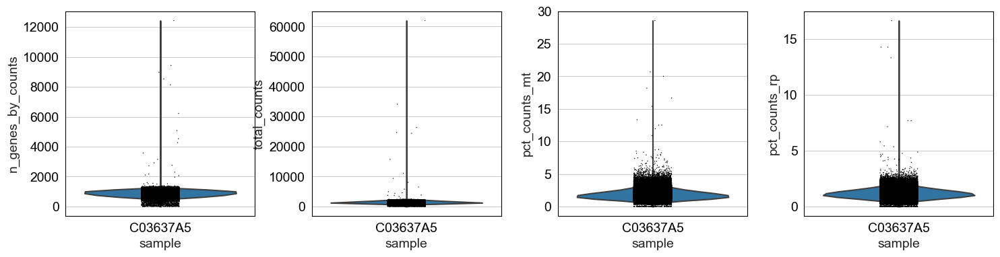

In [5]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['rp'] = adata.var_names.str.startswith('RPL') | adata.var_names.str.startswith('RPS')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt', 'rp'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, groupby='sample', keys=['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_rp'])

In [45]:
sc.pp.filter_cells(adata, min_genes=550)
sc.pp.filter_genes(adata, min_cells=50)

sc.pp.filter_cells(adata, max_genes=2000)
adata = adata[adata.obs['pct_counts_mt'] <= 10, :]

adata

filtered out 4377 cells that have less than 550 genes expressed
filtered out 9646 genes that are detected in less than 50 cells
filtered out 18 cells that have more than 2000 genes expressed


View of AnnData object with n_obs × n_vars = 110356 × 23135
    obs: 'x', 'y', 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'n_genes'
    var: 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'sample_colors'
    obsm: 'spatial'

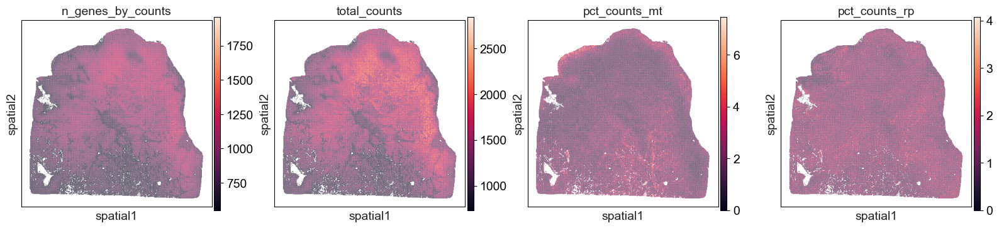

In [16]:
sc.pp.filter_cells(adata, min_genes=550)
sc.pp.filter_genes(adata, min_cells=50)

sc.pp.filter_cells(adata, max_genes=2000)
adata = adata[adata.obs['pct_counts_mt'] <= 10, :]

sc.pl.spatial(adata, color=['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_rp'], spot_size=50, basis='spatial')

In [48]:
adata.layers['counts'] = adata.X.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:01)


In [51]:
raw = adata.copy()

extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
2612


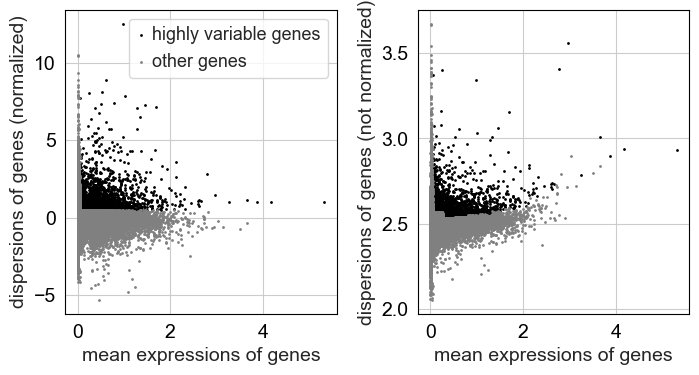

In [53]:
min_disp=0.5
min_mean=0.05
max_mean=8

sc.pp.highly_variable_genes(adata, flavor="seurat", min_disp=min_disp, min_mean=min_mean, max_mean=max_mean)
print(adata.var['highly_variable'].sum())
sc.pl.highly_variable_genes(adata)

In [54]:
adata.raw = adata

/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:842: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:52)


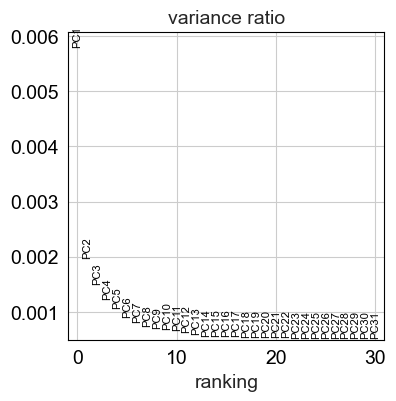

In [55]:
adata = adata[:, adata.var['highly_variable']]
sc.pp.scale(adata, max_value=10)
sc.pp.pca(adata)
sc.pl.pca_variance_ratio(adata)

In [57]:
n_neighbors=40
n_pcs=10
res = 0.5

sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs,)
sc.tl.leiden(adata, resolution=res)


computing neighbors
    using 'X_pca' with n_pcs = 10
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:47)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:04:11)


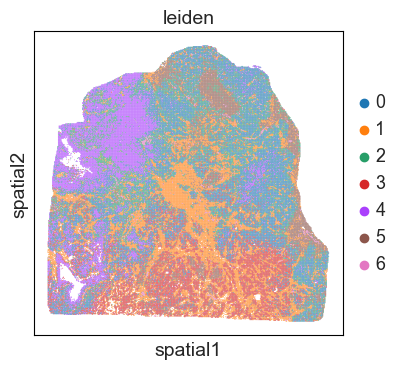

In [59]:
sc.pl.spatial(adata, color='leiden', basis='spatial', spot_size=50)

In [61]:
adata = adata.raw.to_adata()

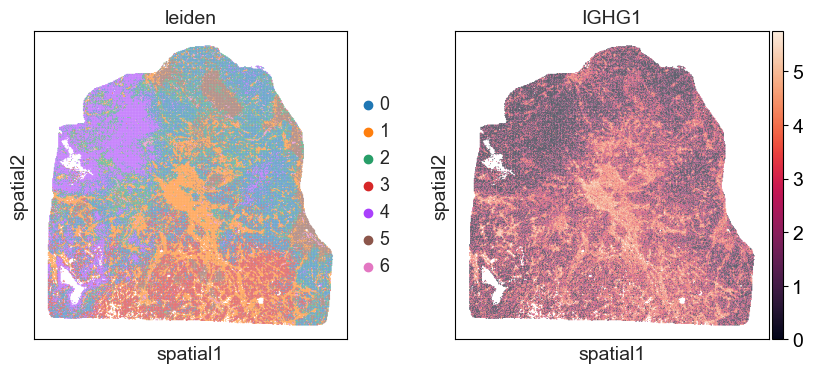

In [63]:
sc.pl.spatial(adata, color=['leiden', 'IGHG1'], spot_size=50, basis='spatial')

In [64]:
adata.layers['counts'] = raw.layers['counts'].copy()

In [65]:
adata.write('202301978_C03637A5.h5ad')

# inferCNV

In [82]:
import infercnvpy as cnv
import anndata as ad

class inferCNV:
    def __init__(self, adata=None, mtx_path=None,layer=None, visum=False, min_cells=5, min_genes=400, mt_pct=20):
        self.adata = adata
        self.mtx_path = mtx_path
        self.layer = layer
        self.visum = visum
        self.min_cells = min_cells
        self.min_genes = min_genes
        self.mt_pct = mt_pct
        if self.adata is None and self.mtx_path is None:
            raise ValueError("Both 'adata' and 'mtx_path' cannot be None. Please provide either 'adata' or 'mtx_path'.")
        if self.adata is not None and self.mtx_path is not None:
            raise ValueError("Only one of 'adata' and 'mtx_path' should be provided, not both.")
        # if provide adata: please use raw counts
        if self.adata is not None:
            if self.layer is None:
                warnings.warn('When "layer" is None Please check your adata.X is raw count', UserWarning)
                self.cnv_adata = ad.AnnData(self.adata.X)
            else:
                self.cnv_adata = ad.AnnData(self.adata.layers[layer])
            self.cnv_adata = self.copy_adata(self.cnv_adata, self.adata)
        else:
            self.cnv_adata = self.get_adata_from_mtx(self.mtx_path, self.visum, self.min_cells, self.min_genes, self.mt_pct)

    def copy_adata(self, adata_get_copy, adata_copy_from):
        adata_get_copy.obs_names = adata_copy_from.obs_names
        adata_get_copy.var_names = adata_copy_from.var_names
        adata_get_copy.obs = adata_copy_from.obs
        adata_get_copy.var = adata_copy_from.var
        adata_get_copy.obsm = adata_copy_from.obsm
        return adata_get_copy

    def get_adata_from_mtx(self, mtx_path, visum, min_cells, min_genes, mt_pct):
        if visum:
            adata = sc.read_visium(path=mtx_path, count_file='filtered_feature_bc_matrix.h5')
            adata.var_names_make_unique()
        else:
            adata = sc.read_10x_mtx(path=f'{mtx_path}/filtered_feature_bc_matrix', cache=True)
            try:
                adata.obs['x'] = adata.obs.index.map(lambda x: int(x.split('_')[1]))
                adata.obs['y'] = adata.obs.index.map(lambda x: int(x.split('_')[2]))
                adata.obsm['spatial'] = adata.obs[['x', 'y']].values
            except:
                adata.obs['x'] = adata.obs.index.map(lambda x: int(x.split('_')[0]))
                adata.obs['y'] = adata.obs.index.map(lambda x: int(x.split('_')[1]))
                adata.obsm['spatial'] = adata.obs[['x', 'y']].values
            adata.var_names_make_unique()
        self.sc_qc(adata, sc_cal=False, sc_filter=True, min_cells=min_cells, min_genes=min_genes, mt_pct=mt_pct)
        return adata

    def sc_qc(self, adata, min_genes=500, max_genes=6000, mt_pct=10, min_cells=50, sc_cal=True, sc_filter=True):
        if sc_cal:
            adata.var['mt'] = adata.var_names.str.startswith('mt-')
            adata.var['rp'] = adata.var_names.str.startswith('Rpl') | adata.var_names.str.startswith('Rps')
            if adata.var['mt'].sum() == 0:
                adata.var['mt'] = adata.var_names.str.startswith('MT-')
                adata.var['rp'] = adata.var_names.str.startswith('RPL') | adata.var_names.str.startswith('RPS')
            sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
            sc.pp.calculate_qc_metrics(adata, qc_vars=['rp'], percent_top=None, log1p=False, inplace=True)

        if sc_filter:
            sc.pp.filter_cells(adata, min_genes=min_genes)
            sc.pp.filter_cells(adata, max_genes=max_genes)
            sc.pp.filter_genes(adata, min_cells=min_cells)
        return adata
    
    def get_gene_info(self,gtf_file):
        gene_info = pd.read_csv(gtf_file, sep='\t', comment='#', usecols=[0,2,3,4,8], names=['chromosome','type','start','end', 'info'],low_memory=False)
        gene_info['gene_id'] = gene_info['info'].str.extract(r'gene_id "([^"]+)";')
        gene_info = gene_info.drop_duplicates(subset='gene_id').reset_index(drop=True)
        gene_info['gene_name'] = gene_info['info'].str.extract(r'gene_name "([^"]+)";')
        gene_info = gene_info[gene_info['type'] == 'gene']
        gene_info = gene_info.drop_duplicates('gene_name')
        gene_info = gene_info.set_index('gene_name')
        return gene_info
    
    def step1_bulid_gene_info(self,gene_info):
        self.group_info = gene_info
        if isinstance(gene_info, pd.DataFrame):
            print('Read gene information from exist DataFrame ...')
            gene_info_df = gene_info[['chromosome','start','end']]
        elif os.path.isfile(gene_info):
            print('Read gene information from GTF file ...')
            gene_info_df = self.get_gene_info(gene_info)
        else:
            raise ValueError('inValid gene_info. gene_info must be DataFrame(obs index with chromosome - start - end) or gtf file')
        self.cnv_adata.var['chromosome'] = gene_info_df['chromosome']
        self.cnv_adata.var['start'] = gene_info_df['start']
        self.cnv_adata.var['end'] = gene_info_df['end']
        print('>> Already build CNV_adata gene info')
    
    def step2_CallCNV(self,group_info,reference_key,reference_cat):
        self.reference_cat = reference_cat
        self.reference_key = reference_key
        self.group_info = group_info
        if isinstance(group_info, ad.AnnData):
            print('Read group information from exist AnnData ...')
            self.cnv_adata.obs[reference_key] = group_info.obs[reference_key]
        elif isinstance(group_info, pd.DataFrame):
            print('Read group information from exist DataFrame ...')
            self.cnv_adata.obs[reference_key] = group_info[reference_key]
            self.cnv_adata = self.cnv_adata[~self.cnv_adata.obs[reference_key].isna()].copy()
        else:
            raise ValueError('inValid group_info. gene_info must be adata with reference_key or df with reference_key')
        reference_set = set(self.cnv_adata.obs[reference_key].unique())
        query_set = set(reference_cat)
        if not query_set.issubset(reference_set):
            raise ValueError('reference_key must contain all reference_cat')
        self.cnv_adata.var['chromosome'] = self.cnv_adata.var['chromosome'].apply(lambda x: f'chr{x}' if str(x).isdigit() or x in ['X', 'Y'] else x)
        cnv.tl.infercnv(
            self.cnv_adata,
            reference_key = reference_key,
            reference_cat = reference_cat,
            window_size=250,
            n_jobs = 10
        )

    def step3_1_CNV_leiden(self):
        cnv.tl.pca(self.cnv_adata)
        cnv.pp.neighbors(self.cnv_adata)
        # cnv.tl.umap(self.cnv_adata)

    def step3_2_CNV_leiden(self,resolution = 1):
        cnv.tl.leiden(self.cnv_adata,resolution = resolution)
    
    def chromosome_heatmap(self, groupby = 'cnv_leiden', **kwds):
        cnv.pl.chromosome_heatmap(self.cnv_adata, groupby = groupby, **kwds)

In [78]:
infercnv = inferCNV(adata = adata, layer='counts', visum = False)

In [79]:
gtf = '/storage/liuyi/08.stereo_v2/reference/human/GRCh38EBV_V1.gtf'
infercnv.step1_bulid_gene_info(gene_info=gtf)

Read gene information from GTF file ...
>> Already build CNV_adata gene info


In [80]:
infercnv.step2_CallCNV(group_info = adata.obs, reference_key ='leiden' ,reference_cat = ['1', '5'])

Read group information from exist DataFrame ...


  0%|          | 0/23 [00:00<?, ?it/s]

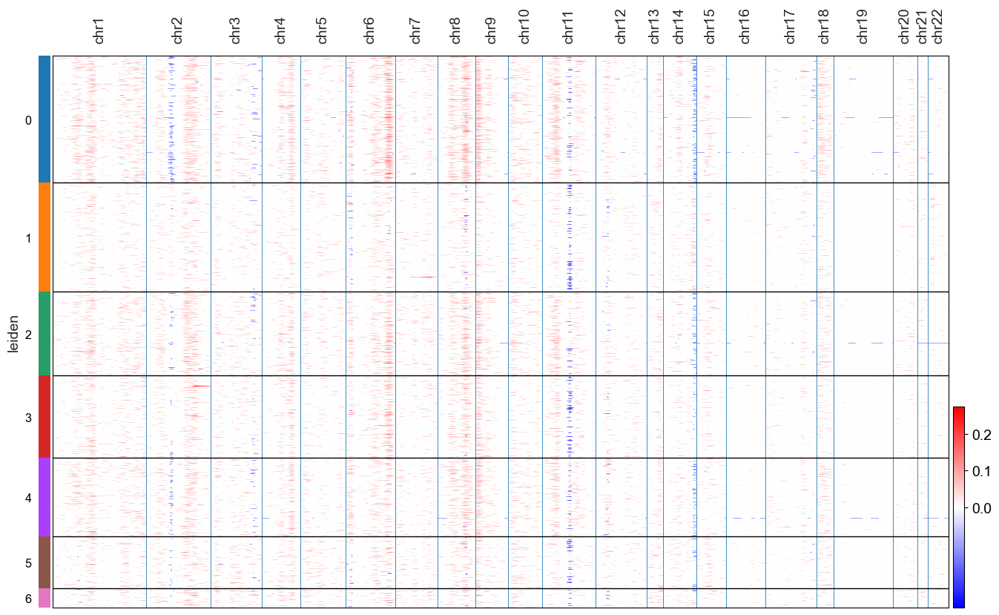

In [81]:
infercnv.chromosome_heatmap(groupby='leiden' )

In [83]:
infercnv.step3_1_CNV_leiden()
infercnv.step3_2_CNV_leiden(resolution = 0.5)

computing PCA
    with n_comps=50
    finished (0:00:17)
computing neighbors
    finished: added to `.uns['cnv_neighbors']`
    `.obsp['cnv_neighbors_distances']`, distances for each pair of neighbors
    `.obsp['cnv_neighbors_connectivities']`, weighted adjacency matrix (0:00:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:39)
running Leiden clustering
    finished: found 3 clusters and added
    'cnv_leiden', the cluster labels (adata.obs, categorical) (0:01:55)


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern pruned
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 19 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'a', 'c', 'd', 'e', 'i', 'l', 'n', 'nonmarkingreturn', 'one', 'p', 's', 'space', 't', 'two', 'underscore', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 66, 68, 70, 71, 72, 76, 79, 81, 83, 86, 87, 89]
INFO:fontTools.subset:Closed glyph list over 'GSUB': 19 glyphs after
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'a', 'c', 'd', 'e', 'i', 'l', 'n', 'nonmarkingreturn', 'one', 'p', 's', 'spac

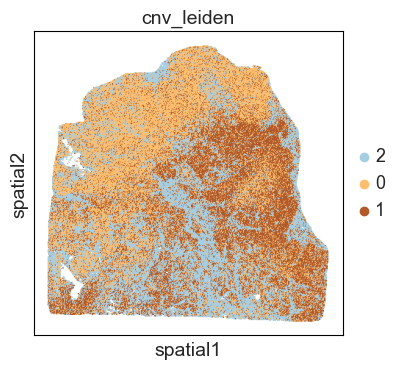

In [115]:
vector(False)
sc.pl.spatial(infercnv.cnv_adata,color = 'cnv_leiden',spot_size = 100,basis = 'spatial', palette='Paired', save='cnv_leiden.pdf')

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern pruned
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 25 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'c', 'd', 'e', 'eight', 'five', 'four', 'h', 'i', 'l', 'n', 'nine', 'nonmarkingreturn', 'one', 'period', 'r', 'seven', 'six', 'space', 'three', 'two', 'underscore', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 66, 70, 71, 72, 75, 76, 79, 81, 85, 89]
INFO:fontTools.subset:Closed glyph list over 'GSUB': 25 glyphs after
INFO:fontTools.subset:Glyph names: ['.notdef', '.nu

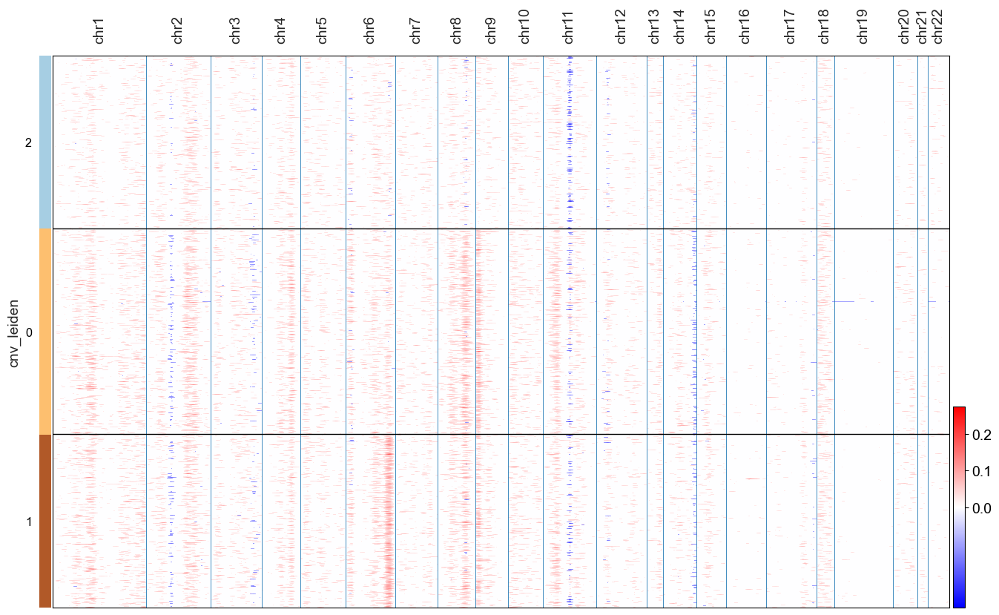

In [105]:
infercnv.cnv_adata.obs['cnv_leiden'] = pd.Categorical(infercnv.cnv_adata.obs['cnv_leiden'], categories=['2', '0', '1'])
infercnv.chromosome_heatmap(groupby='cnv_leiden', save='cnv.pdf')

# ESR1 locus

In [106]:
from gtfparse import read_gtf
hg_gtf = read_gtf(gtf)
hg_gtf = hg_gtf.to_pandas()

INFO:root:Extracted GTF attributes: ['gene_id', 'gene_version', 'gene_name', 'gene_source', 'gene_biotype', 'transcript_id', 'transcript_version', 'transcript_name', 'transcript_source', 'transcript_biotype', 'tag', 'transcript_support_level', 'exon_number', 'exon_id', 'exon_version', 'protein_id', 'protein_version', 'ccds_id']


In [107]:
c6 = hg_gtf.loc[(hg_gtf['seqname']=='6') & (hg_gtf['feature']=='gene')]
c6.loc[c6['gene_name']=='ESR1']

,seqname,source,feature,start,end,score,strand,frame,gene_id,gene_version,...,transcript_source,transcript_biotype,tag,transcript_support_level,exon_number,exon_id,exon_version,protein_id,protein_version,ccds_id
902204,6,ensembl_havana,gene,151656691,152129619,NaN,+,0,ENSG00000091831,23,...,,,,,,,,,,


In [112]:
start = c6.loc[c6['gene_name']=='ESR1', 'start'].values[0]
end = c6.loc[c6['gene_name']=='ESR1', 'end'].values[0]

genes = c6.loc[(c6['start'] > (start-4000000)) & (c6['end'] < (end+4000000)), 'gene_name']
genes

899944    AL033504.1
899961    AL365271.1
899965    AL445123.1
899970    AL359382.1
899974    AL513164.1
             ...    
905727    AL596202.1
905731         TFB1M
905786        CLDN20
905796    AL031773.1
905800          NOX3
Name: gene_name, Length: 75, dtype: object

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern pruned
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 49 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'X', 'Y', 'Z', 'a', 'e', 'eight', 'five', 'four', 'g', 'hyphen', 'i', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'x', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 

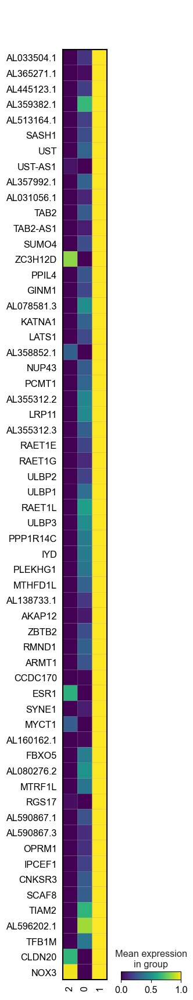

In [113]:
genes = genes[genes.isin(cnv_adata.var_names)].values
sc.pl.matrixplot(infercnv.cnv_adata, var_names=genes, groupby='cnv_leiden', standard_scale='var', 
                 cmap='viridis',  swap_axes=True, save='esr1.pdf')

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern pruned
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 45 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'X', 'Y', 'Z', 'a', 'eight', 'five', 'four', 'hyphen', 'i', 'l', 'minus', 'nine', 'nonmarkingreturn', 'one', 'p', 'period', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 

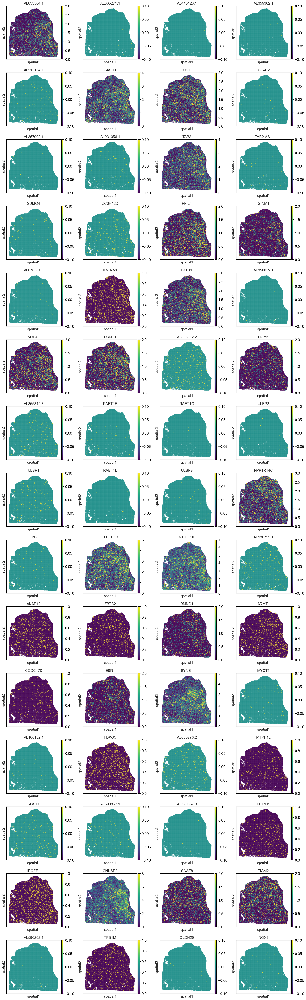

In [114]:
sc.pl.spatial(cnv_adata,color = genes, spot_size = 80,basis = 'spatial', ncols=4, cmap='viridis', save='subtype2.pdf', vmax='p98')

# Marker genes

In [92]:
bin20 = gem2adata('gem/C03637A5.lasso.bin1.Label1.gem.gz', binsize=20, in_type='file')

In [116]:
# bin20.write('C03637A5_bin20_raw.h5ad')
bin20 = sc.read_h5ad('C03637A5_bin20_raw.h5ad')
bin20.X.data

array([1, 3, 1, ..., 1, 1, 2])

In [117]:
sc.pp.normalize_total(bin20, target_sum=1e4)
sc.pp.log1p(bin20)

normalizing counts per cell
    finished (0:00:03)


In [131]:
sub = bin20[(bin20.obs['x']>11500) & (bin20.obs['x']<14500)]
sub =  sub[(sub.obs['y']>3000) & (sub.obs['y']<5500)]

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern pruned
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 18 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'P', 'S', 'a', 'five', 'four', 'i', 'l', 'nonmarkingreturn', 'one', 'p', 's', 'space', 't', 'three', 'two', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 51, 54, 68, 76, 79, 83, 86, 87]
INFO:fontTools.subset:Closed glyph list over 'GSUB': 18 glyphs after
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'P', 'S', 'a', 'five', 'four', 'i', 'l', 'nonmarkingreturn', 'one', 'p', 's', 'space'

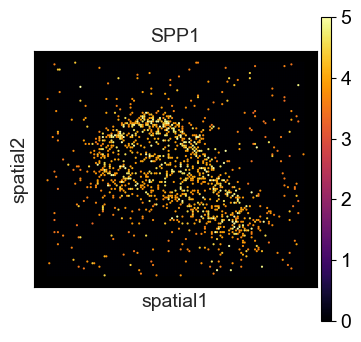

In [130]:
fig, ax = plt.subplots()
ax.set_facecolor('black')
vector(True)
sc.pl.spatial(sub, color='SPP1', spot_size=25, vmax=5, ax=ax, cmap='inferno', save='spp1.pdf')


In [127]:
sub2 = bin20[(bin20.obs['x']>7000) & (bin20.obs['x']<13000)]
sub2 =  sub2[(sub2.obs['y']>7000) & (sub2.obs['y']<13000)]

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern pruned
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 19 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'G', 'H', 'I', 'a', 'five', 'four', 'i', 'l', 'nonmarkingreturn', 'one', 'p', 's', 'space', 't', 'three', 'two', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 42, 43, 44, 68, 76, 79, 83, 86, 87]
INFO:fontTools.subset:Closed glyph list over 'GSUB': 19 glyphs after
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'G', 'H', 'I', 'a', 'five', 'four', 'i', 'l', 'nonmarkingreturn', 'one', 'p'

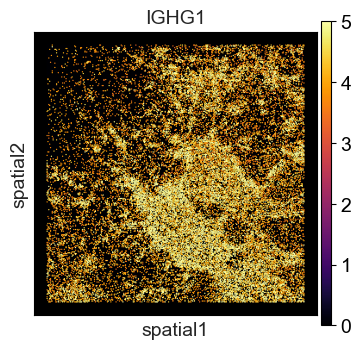

In [128]:
fig, ax = plt.subplots()
ax.set_facecolor('black')
vector(True)
sc.pl.spatial(sub2, color='IGHG1', spot_size=30, vmax=5, ax=ax, cmap='inferno', save='IGHG1.pdf')

... storing 'chromosome' as categorical


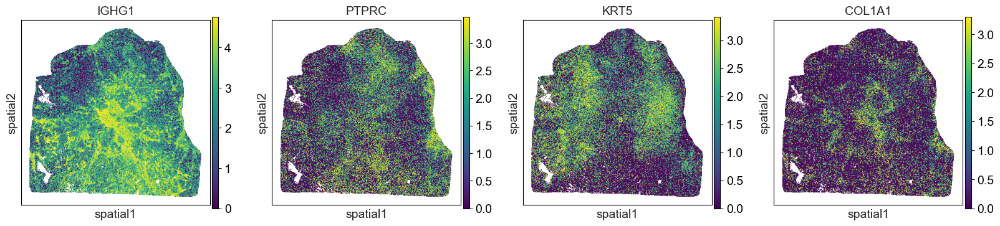

In [132]:
sc.pl.spatial(adata, color=['IGHG1', 'PTPRC', 'KRT5', 'COL1A1'], spot_size=80, vmax='p99', cmap='viridis')